# Table of Contents

- [Problem Statement](#Problem-Statement:)
- [Imports](#Imports:)
- [Read Data](#Read-Data:)
- [Cleaning Data](#Cleaning-Data:)
- [Feature Engineering](#Feature-Engineering:)
- [Initial EDA](#Initial-EDA:)
- [Model/Evaluation](#model)
- [More Data/Retrain](#retrain)
- [Findings](#Findings:)
- [Conclusion](#Conclusions:)

# Problem Statement:

The Society of Professional Journalists hired The East-West Alliance (TEWA) as consultants to create a model that predicts and classifies articles as either fake or real based on the title and content of the news article. The goal aims to mitigate the spread of misinformation and promote accountability in the media.  It would help out social media sites like Facebook and Twitter to filter out spam and/or fake stories that would make a culpable person believe them.

# Imports:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import datetime as dt
import nltk, string, re
import joblib

## Data Cleaning
from dateutil.parser import parse, ParserError

## NLP Considerations
from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS
from wordcloud import WordCloud
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from bs4 import BeautifulSoup

# Read Data:

In [2]:
# Fake.csv and True.csv Source: https://www.kaggle.com/datasets/clmentbisaillon/fake-and-real-news-dataset
Fake_df = pd.read_csv('../Data/Fake.csv')
Fake_df.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [3]:
Fake_df.shape

(23481, 4)

In [4]:
Fake_df['target'] = 1

In [5]:
Fake_df.isna().sum()

title      0
text       0
subject    0
date       0
target     0
dtype: int64

In [6]:
# The shape does not match the original data file. Original 23502 while loaded shape is 23481
Fake_df.shape 

(23481, 5)

In [7]:
True_df = pd.read_csv('../Data/True.csv')
True_df.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [8]:
True_df['target'] = 0

In [9]:
#Original Shape
True_df.shape

(21417, 5)

In [10]:
# Expected number of records
Fake_df.shape[0] + True_df.shape[0]

44898

In [11]:
# Combine Fake and True Datasets
Full_df = pd.concat([Fake_df,True_df])
Full_df.shape

(44898, 5)

In [12]:
Full_df.reset_index(inplace=True)

In [13]:
Full_df.drop(columns="index", inplace=True)

In [14]:
Full_df.head()

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",1
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",1
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",1
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",1
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",1


In [15]:
Full_df.tail()

,title,text,subject,date,target
44893,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017",0
44894,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017",0
44895,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017",0
44896,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017",0
44897,Indonesia to buy $1.14 billion worth of Russia...,JAKARTA (Reuters) - Indonesia will buy 11 Sukh...,worldnews,"August 22, 2017",0


In [16]:
Full_df.shape

(44898, 5)

# Cleaning Data:

In [17]:
# Creating a new column to append as a new date column.
new_date = []
for x in range(0, len(Full_df['date'])):
        try:
            bool(parse(Full_df.loc[x]['date'])) # returns True if a cell is in datetime format
        except ParserError:
            new_date.append(np.nan) # runs this line if there is an error
        else:
            new_date.append(Full_df.loc[x]['date']) # this code runs if there is no error

#Try and except: https://www.youtube.com/watch?v=NIWwJbo-9_8&ab_channel=CoreySchafer
#Date Validation: https://www.geeksforgeeks.org/python-validate-string-date-format/
#ParseError Code: https://dateutil.readthedocs.io/en/stable/parser.html#dateutil.parser.ParserError

In [18]:
Full_df['date'] = new_date

In [19]:
Full_df['date'] = pd.to_datetime(Full_df['date'])

In [20]:
Full_df.dtypes

title              object
text               object
subject            object
date       datetime64[ns]
target              int64
dtype: object

In [21]:
# Remove any whitespaces in these columns
Full_df['title'] = Full_df['title'].map(lambda x: x.strip())
Full_df['text'] = Full_df['text'].map(lambda x: x.strip())

In [22]:
# Reference to the original Full DF
Full_df.shape

(44898, 5)

In [23]:
# Drop Duplicate rows
Full_df.drop_duplicates(['title','text'],inplace = True)
Full_df.shape
#17914(Text)-17462(title)

(39103, 5)

In [24]:
Full_df.drop_duplicates(['text'],inplace = True)
Full_df.shape


(38640, 5)

In [25]:
Full_df.dropna(inplace = True)
Full_df.shape

(38634, 5)

In [26]:
Full_df['target'].value_counts(normalize=True)

0    0.548481
1    0.451519
Name: target, dtype: float64

# Feature Engineering:

In [27]:
Full_df["all_text"] = Full_df["title"] + " " + Full_df["text"]

In [28]:
Full_df

,title,text,subject,date,target,all_text
0,Donald Trump Sends Out Embarrassing New Year’s...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,1,Donald Trump Sends Out Embarrassing New Year’s...
1,Drunk Bragging Trump Staffer Started Russian C...,House Intelligence Committee Chairman Devin Nu...,News,2017-12-31,1,Drunk Bragging Trump Staffer Started Russian C...
2,Sheriff David Clarke Becomes An Internet Joke ...,"On Friday, it was revealed that former Milwauk...",News,2017-12-30,1,Sheriff David Clarke Becomes An Internet Joke ...
3,Trump Is So Obsessed He Even Has Obama’s Name ...,"On Christmas day, Donald Trump announced that ...",News,2017-12-29,1,Trump Is So Obsessed He Even Has Obama’s Name ...
4,Pope Francis Just Called Out Donald Trump Duri...,Pope Francis used his annual Christmas Day mes...,News,2017-12-25,1,Pope Francis Just Called Out Donald Trump Duri...
...,...,...,...,...,...,...
44893,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,2017-08-22,0,'Fully committed' NATO backs new U.S. approach...
44894,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,2017-08-22,0,LexisNexis withdrew two products from Chinese ...
44895,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,2017-08-22,0,Minsk cultural hub becomes haven from authorit...
44896,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,2017-08-22,0,Vatican upbeat on possibility of Pope Francis ...


In [29]:
stop=set(stopwords.words('english'))
lemmatizer = nltk.stem.WordNetLemmatizer()
wordTokenizer = nltk.tokenize.WhitespaceTokenizer()

def Preprocessing(text):
    text = str(text).lower()
    text = re.sub('https?://\S+|www\.\S+', ' ', text)
    text = re.sub(' +',' ',text)
    text = re.sub('[%s]' % re.escape(string.punctuation), ' ', text)
    text = re.sub(r'[^a-zA-Z\s]', ' ', str(text))
    text = BeautifulSoup(text,  features="lxml").text 
    text = re.sub('https?://\S+|www\.\S+', ' ', text)
    text = re.sub('<.*?>+', ' ', text)
    text = re.sub('\n', ' ', text)
    text = ' '.join([lemmatizer.lemmatize(w) for w in wordTokenizer.tokenize(text) if (w not in stop)])
    # text = ' '.join([token.lemma_ for token in list(nlp(text)) if (token.is_stop == False)])
    return text

#Source: https://www.kaggle.com/code/mbnhmd/models-comparison-on-true-fake-news-dataset

In [30]:
Full_df['cleanText'] = Full_df['text'].apply(lambda x:Preprocessing(x))

In [31]:
## Creates columns based on the count of words and the count of characters
Full_df["title_char_length"] = Full_df["title"].apply(lambda x: len(x))
Full_df["title_word_count"] = Full_df["title"].apply(lambda x: len(str(x).split()))
Full_df["text_char_length"] = Full_df["cleanText"].apply(lambda x: len(x))
Full_df["text_word_count"] = Full_df["cleanText"].apply(lambda x: len(str(x).split()))
## Create one additional column which is the characters per word in title and text
Full_df["char_per_word_title"] = Full_df["title_char_length"] / Full_df["title_word_count"]
Full_df["char_per_word_text"] = Full_df["text_char_length"] / Full_df["text_word_count"]

In [32]:
Full_df.head()

,title,text,subject,date,target,all_text,cleanText,title_char_length,title_word_count,text_char_length,text_word_count,char_per_word_title,char_per_word_text
0,Donald Trump Sends Out Embarrassing New Year’s...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,1,Donald Trump Sends Out Embarrassing New Year’s...,donald trump wish american happy new year leav...,78,12,1792,266,6.500000,6.736842
1,Drunk Bragging Trump Staffer Started Russian C...,House Intelligence Committee Chairman Devin Nu...,News,2017-12-31,1,Drunk Bragging Trump Staffer Started Russian C...,house intelligence committee chairman devin nu...,68,8,1359,184,8.500000,7.385870
2,Sheriff David Clarke Becomes An Internet Joke ...,"On Friday, it was revealed that former Milwauk...",News,2017-12-30,1,Sheriff David Clarke Becomes An Internet Joke ...,friday revealed former milwaukee sheriff david...,89,15,2349,342,5.933333,6.868421
3,Trump Is So Obsessed He Even Has Obama’s Name ...,"On Christmas day, Donald Trump announced that ...",News,2017-12-29,1,Trump Is So Obsessed He Even Has Obama’s Name ...,christmas day donald trump announced would bac...,77,14,1787,263,5.500000,6.794677
4,Pope Francis Just Called Out Donald Trump Duri...,Pope Francis used his annual Christmas Day mes...,News,2017-12-25,1,Pope Francis Just Called Out Donald Trump Duri...,pope francis used annual christmas day message...,69,11,1423,212,6.272727,6.712264


In [33]:
Full_df['text_word_count'].value_counts().sort_values()

716       1
767       1
984       1
1125      1
922       1
       ... 
178     168
185     168
52      172
218     172
45      172
Name: text_word_count, Length: 1037, dtype: int64

In [34]:
Full_df.drop(Full_df.loc[Full_df['text_word_count'] == 0].index, inplace = True) #Using text_word_count, removes rows with no cleanText

In [35]:
Full_df.shape

(38584, 13)

# Initial EDA:

In [36]:
Full_df.loc[Full_df['target']==1,:]

,title,text,subject,date,target,all_text,cleanText,title_char_length,title_word_count,text_char_length,text_word_count,char_per_word_title,char_per_word_text
0,Donald Trump Sends Out Embarrassing New Year’s...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31,1,Donald Trump Sends Out Embarrassing New Year’s...,donald trump wish american happy new year leav...,78,12,1792,266,6.500000,6.736842
1,Drunk Bragging Trump Staffer Started Russian C...,House Intelligence Committee Chairman Devin Nu...,News,2017-12-31,1,Drunk Bragging Trump Staffer Started Russian C...,house intelligence committee chairman devin nu...,68,8,1359,184,8.500000,7.385870
2,Sheriff David Clarke Becomes An Internet Joke ...,"On Friday, it was revealed that former Milwauk...",News,2017-12-30,1,Sheriff David Clarke Becomes An Internet Joke ...,friday revealed former milwaukee sheriff david...,89,15,2349,342,5.933333,6.868421
3,Trump Is So Obsessed He Even Has Obama’s Name ...,"On Christmas day, Donald Trump announced that ...",News,2017-12-29,1,Trump Is So Obsessed He Even Has Obama’s Name ...,christmas day donald trump announced would bac...,77,14,1787,263,5.500000,6.794677
4,Pope Francis Just Called Out Donald Trump Duri...,Pope Francis used his annual Christmas Day mes...,News,2017-12-25,1,Pope Francis Just Called Out Donald Trump Duri...,pope francis used annual christmas day message...,69,11,1423,212,6.272727,6.712264
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22698,The White House and The Theatrics of ‘Gun Cont...,21st Century Wire says All the world s a stage...,US_News,2016-01-07,1,The White House and The Theatrics of ‘Gun Cont...,st century wire say world stage men woman mere...,50,9,4983,707,5.555556,7.048091
22699,Activists or Terrorists? How Media Controls an...,Randy Johnson 21st Century WireThe majority of...,US_News,2016-01-07,1,Activists or Terrorists? How Media Controls an...,randy johnson st century wirethe majority main...,89,13,17756,2388,6.846154,7.435511
22700,"BOILER ROOM – No Surrender, No Retreat, Heads ...",Tune in to the Alternate Current Radio Network...,US_News,2016-01-06,1,"BOILER ROOM – No Surrender, No Retreat, Heads ...",tune alternate current radio network acr anoth...,65,13,868,128,5.000000,6.781250
22701,Federal Showdown Looms in Oregon After BLM Abu...,21st Century Wire says A new front has just op...,US_News,2016-01-04,1,Federal Showdown Looms in Oregon After BLM Abu...,st century wire say new front opened long batt...,95,16,13821,1936,5.937500,7.138946


In [37]:
fake_subject_EDA = pd.get_dummies(columns = ["subject"], data = Full_df, drop_first=False)

In [38]:
Fake_Govt_News = fake_subject_EDA["subject_Government News"].sum()
Fake_News_News = fake_subject_EDA["subject_News"].sum()
Fake_US_News = fake_subject_EDA["subject_US_News"].sum()
Fake_Left_News = fake_subject_EDA["subject_left-news"].sum()
Fake_Politics_News = fake_subject_EDA["subject_politics"].sum()

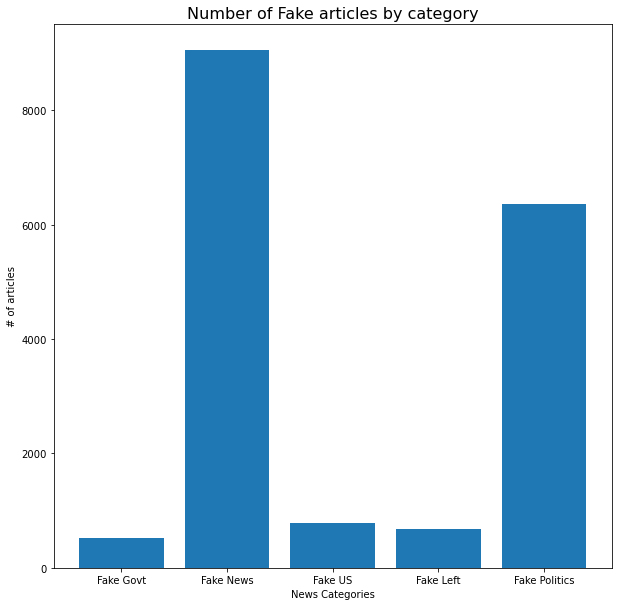

In [39]:
## Define the figure
fig = plt.figure(figsize=(10,10))
Category_Count_XName = ["Fake Govt", "Fake News", "Fake US", "Fake Left", "Fake Politics"]
Category_Count_Yname = [Fake_Govt_News, Fake_News_News, Fake_US_News, Fake_Left_News, Fake_Politics_News]
plt.bar(Category_Count_XName,
        Category_Count_Yname)

plt.xlabel("News Categories")
plt.ylabel("# of articles")
plt.title("Number of Fake articles by category", fontsize = 16);

In [40]:
# Numerous funtions/for loops will use this dictionary 
# Two if statements will be created with the same code for functions and loops. One to grab the targets of 0 and 1 and the "All" to grab both
df_dict = {'Fake': 1,'True': 0,'All':None}

In [41]:
# Note: A bunch of the words are not in the english dicitonary
# Splits corpus and appends each word to an empty list
list_of_wordsa = []
for key in df_dict:
    list_of_words = []
    if key != 'All':
        for i in Full_df.loc[Full_df['target'] == df_dict[key], 'cleanText']:
            i = i.split()
            for j in i:
                list_of_words.append(j)
    else:
        for i in Full_df['cleanText']:
            i = i.split()
            for j in i:
                list_of_words.append(j)
    list_of_wordsa.append(list_of_words)
    # prints the total number of words on the list
    print(f'Total {key} Words: {len(list_of_words)}')
    # prints the total number of unique words using the set method
    print(f'Total unique {key} Words: {len(set(list_of_words))}\n')

Total Fake Words: 4134778
Total unique Fake Words: 78586

Total True Words: 4855338
Total unique True Words: 57899

Total All Words: 8990116
Total unique All Words: 103039



In [42]:
# print average words/character for title and text for Fake, True, and All News (Using the order from the df_dict).
for key in df_dict:
    if key != 'All':
        print(f"""
        The avg words per title in {key} news equals: {Full_df.loc[Full_df['target']==df_dict[key],'title_word_count'].mean()}
        The avg words per text in {key} news equals: {Full_df.loc[Full_df['target']==df_dict[key],'text_word_count'].mean()} 
        The avg characters per title words in {key} news equals: {Full_df.loc[Full_df['target']==df_dict[key],'char_per_word_title'].mean()}
        The avg characterss per text words in {key} news equals: {Full_df.loc[Full_df['target']==df_dict[key],'char_per_word_text'].mean()}""")
    else:
        print(f"""
        The avg words per title in {key} news equals: {Full_df['title_word_count'].mean()}
        The avg words per text in {key} news equals: {Full_df['text_word_count'].mean()}
        The avg characters per title words in {key} news equals: {Full_df['char_per_word_title'].mean()}
        The avg characterss per text words in {key} news equals: {Full_df['char_per_word_text'].mean()}""")


        The avg words per title in Fake news equals: 14.319190525468553
        The avg words per text in Fake news equals: 237.71288950212718 
        The avg characters per title words in Fake news equals: 6.383920374027688
        The avg characterss per text words in Fake news equals: 7.08511372482584

        The avg words per title in True news equals: 9.951203397829165
        The avg words per text in True news equals: 229.13345917885795 
        The avg characters per title words in True news equals: 6.57434448024439
        The avg characterss per text words in True news equals: 7.350585422011857

        The avg words per title in All news equals: 11.92032967032967
        The avg words per text in All news equals: 233.0011403690649
        The avg characters per title words in All news equals: 6.488499650689817
        The avg characterss per text words in All news equals: 7.230908491137635


In [43]:
## Used to create time series plots for dataframes
## Purpose is to reduce redundant copying and pasting of resused code
def time_plots(df, title = 'Defualt Title', xlab = 'News Over Time'):
    plt.figure(figsize= (30,7))
    df.groupby('date')['text'].count().plot()
    plt.title(title, c ='black', horizontalalignment = 'center', fontdict={'size': 12})
    plt.xlabel(xlab);

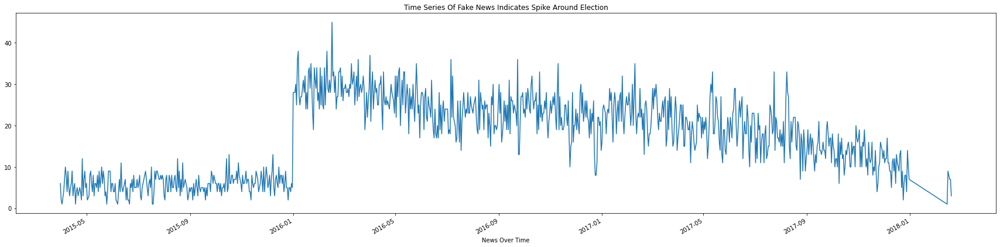

In [44]:
time_plots(Full_df.loc[Full_df['target']==1,:], title='Time Series Of Fake News Indicates Spike Around Election')

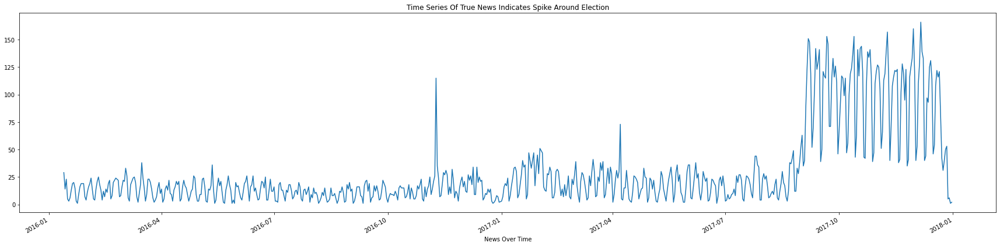

In [45]:
time_plots(Full_df.loc[Full_df['target']==0,:], title='Time Series Of True News Indicates Spike Around Election')

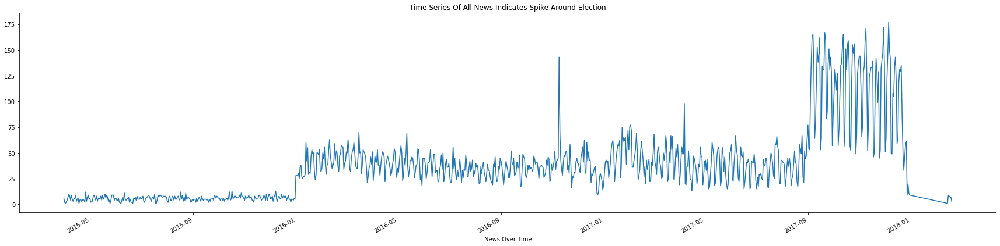

In [46]:
time_plots(Full_df, title='Time Series Of All News Indicates Spike Around Election')

In [47]:
## Function to create bar plots with the input being the dataframe
def words_per_title(df):
    df["title_word_count"].value_counts(normalize=True).plot.bar(color='skyblue', figsize=[20,4]);


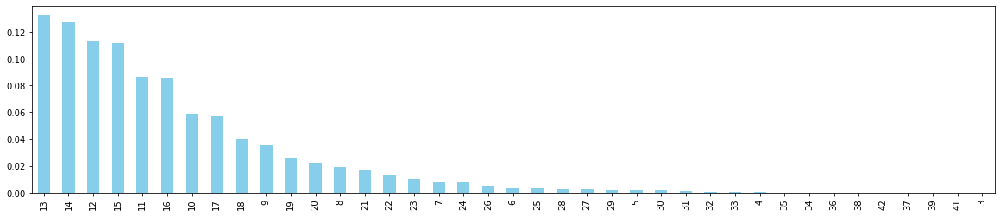

In [48]:
## Words per title in Fake News
words_per_title(Full_df[Full_df['target']==1])

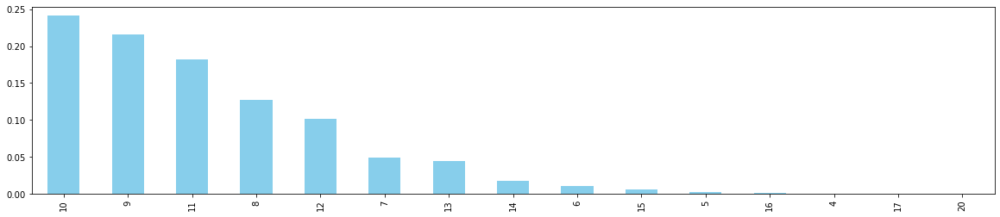

In [49]:
## Words per title in True News
words_per_title(Full_df[Full_df['target']==0])

In [50]:
## Function creates histogram for word/text count using the series of a dataframe
def plot_hist(series, title = None, xlab = None, ylab = None):
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    plt.title(title, fontsize = 12)
    plt.hist(series);

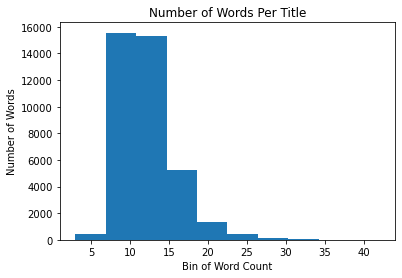

In [51]:
plot_hist(Full_df['title_word_count'], title = 'Number of Words Per Title', 
            xlab='Bin of Word Count', ylab= 'Number of Words')

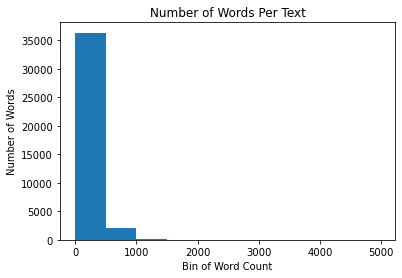

In [52]:
plot_hist(Full_df['text_word_count'], title = 'Number of Words Per Text', 
            xlab='Bin of Word Count', ylab= 'Number of Words')

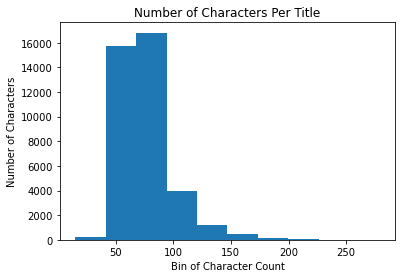

In [53]:
plot_hist(Full_df['title_char_length'], title = 'Number of Characters Per Title', 
            xlab='Bin of Character Count', ylab= 'Number of Characters')

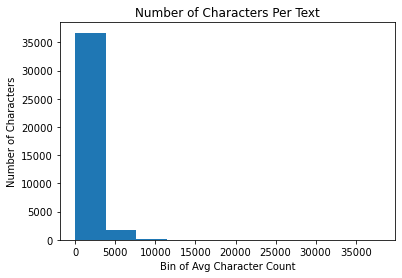

In [54]:
plot_hist(Full_df['text_char_length'], title = 'Number of Characters Per Text', 
        xlab='Bin of Avg Character Count', ylab= 'Number of Characters')

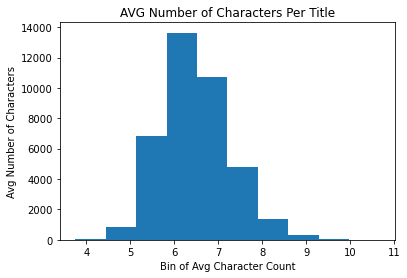

In [55]:
plot_hist(Full_df['char_per_word_title'], title = 'AVG Number of Characters Per Title', 
            xlab='Bin of Avg Character Count', ylab= 'Avg Number of Characters')

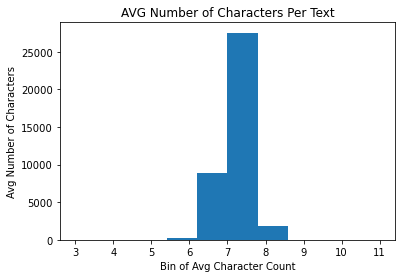

In [56]:
plot_hist(Full_df['char_per_word_text'], title = 'AVG Number of Characters Per Text', 
            xlab='Bin of Avg Character Count', ylab= 'Avg Number of Characters')

In [57]:
## User will input the fake (target = 1) and true series (target = 0)
## Function will plot out both series on the same visualizations
def fake_vs_true_hist(fake_series,true_series, title = None, log = False):
    if log == False:
        plt.hist((fake_series), alpha=0.5)
        plt.hist(true_series)
        plt.title(title)
        plt.tight_layout();
    else:
        plt.hist(np.log(fake_series), alpha=0.5)
        plt.hist(np.log(true_series))
        plt.title(title)
        plt.tight_layout();

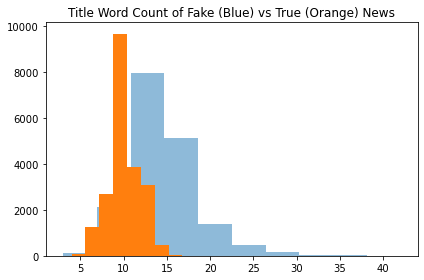

In [58]:
fake_vs_true_hist(fake_series=Full_df[Full_df["target"]==1]["title_word_count"], 
            true_series=Full_df[Full_df["target"]==0]["title_word_count"],
            title="Title Word Count of Fake (Blue) vs True (Orange) News")

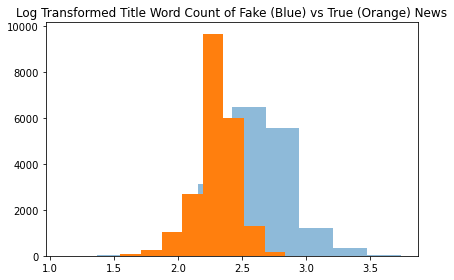

In [59]:
fake_vs_true_hist(fake_series=Full_df[Full_df["target"]==1]["title_word_count"], 
            true_series=Full_df[Full_df["target"]==0]["title_word_count"],
            title="Log Transformed Title Word Count of Fake (Blue) vs True (Orange) News", log=True)

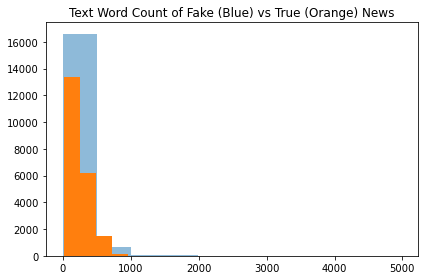

In [60]:
fake_vs_true_hist(fake_series=Full_df[Full_df["target"]==1]["text_word_count"], 
            true_series=Full_df[Full_df["target"]==0]["text_word_count"],
            title="Text Word Count of Fake (Blue) vs True (Orange) News")

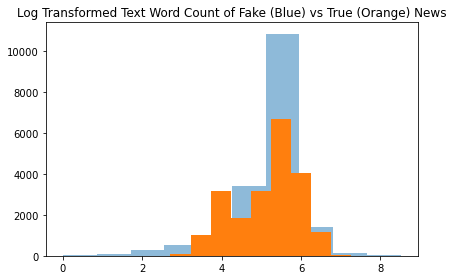

In [61]:
fake_vs_true_hist(fake_series=Full_df[Full_df["target"]==1]["text_word_count"], 
            true_series=Full_df[Full_df["target"]==0]["text_word_count"],
            title="Log Transformed Text Word Count of Fake (Blue) vs True (Orange) News", log=True)

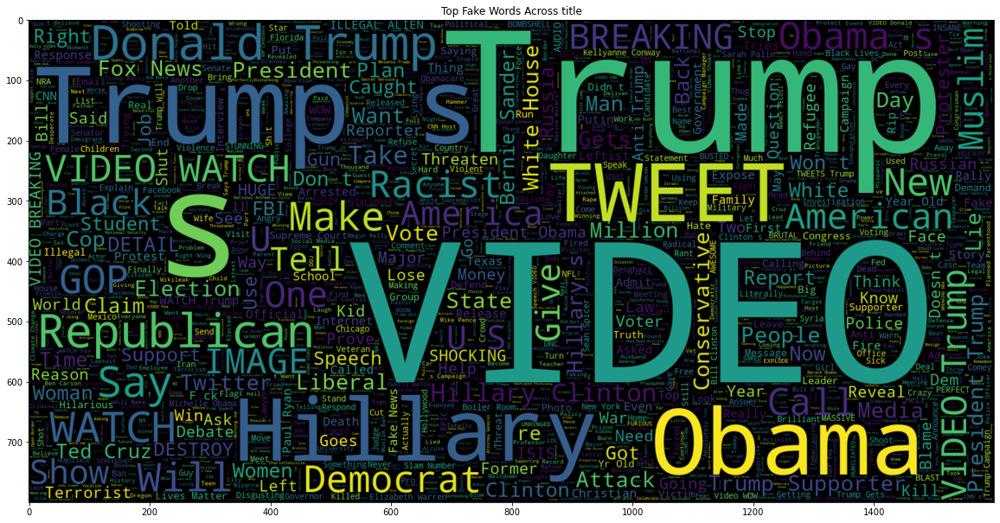

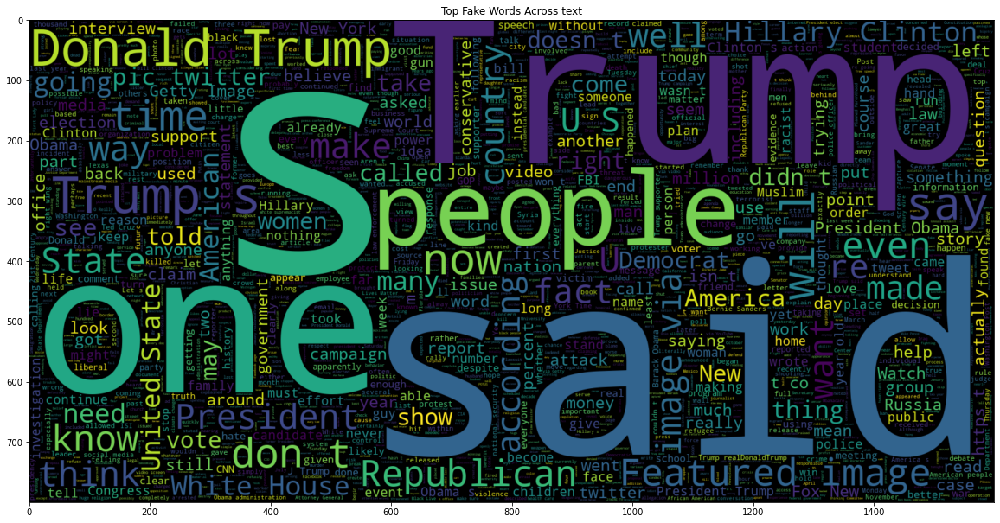

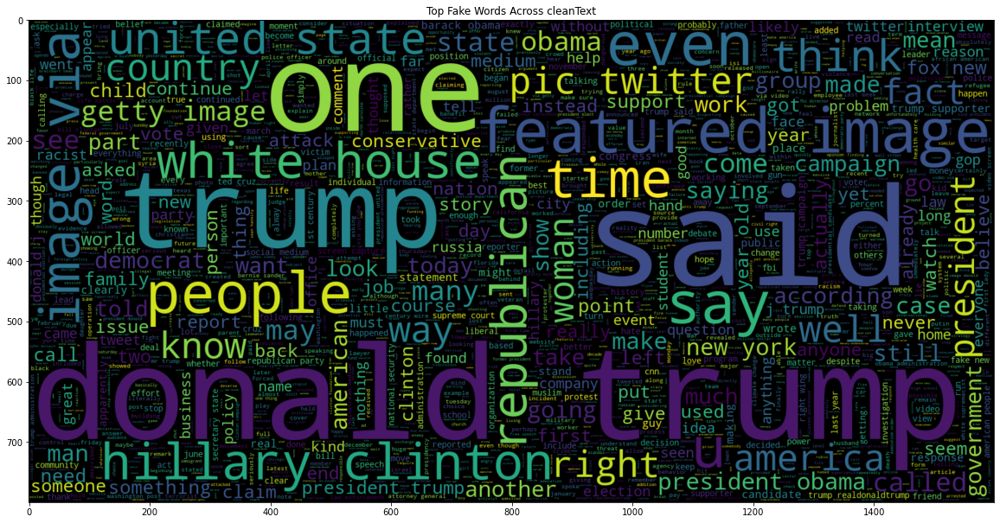

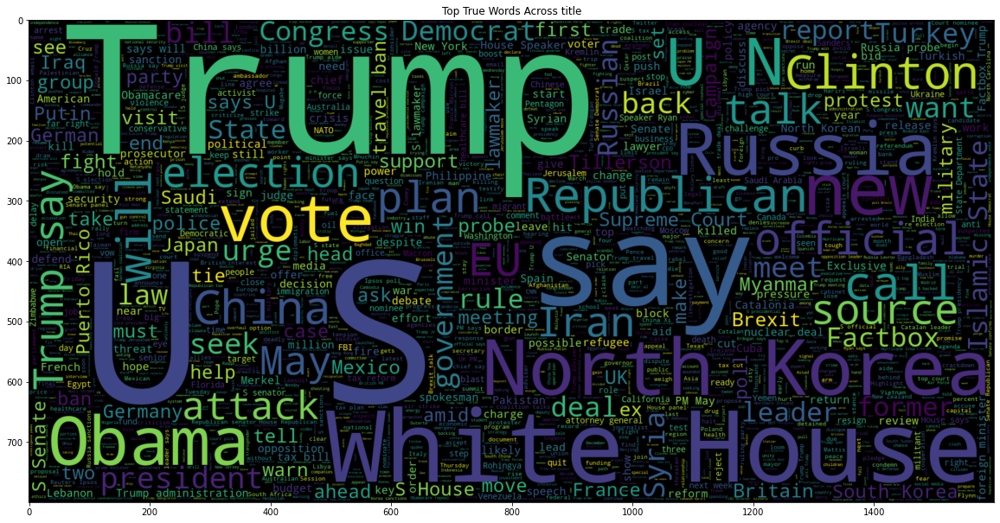

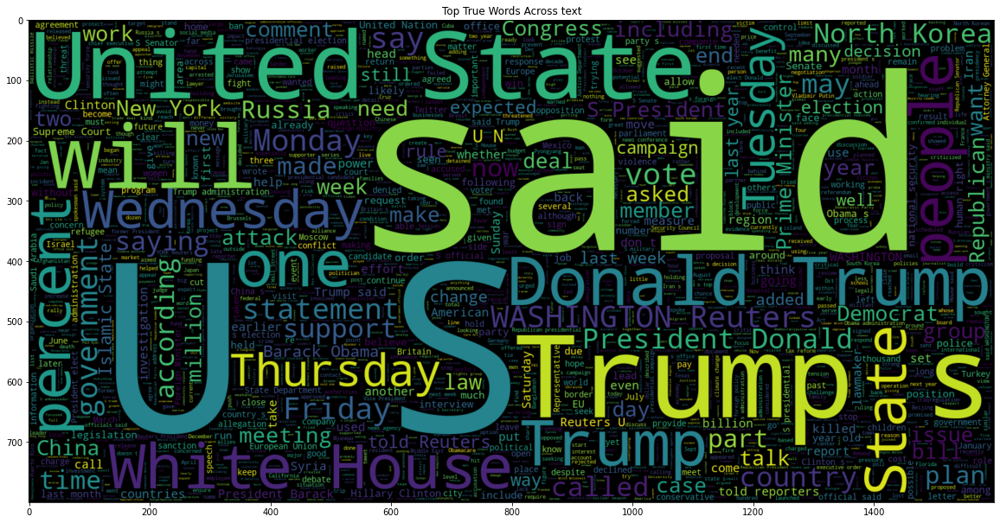

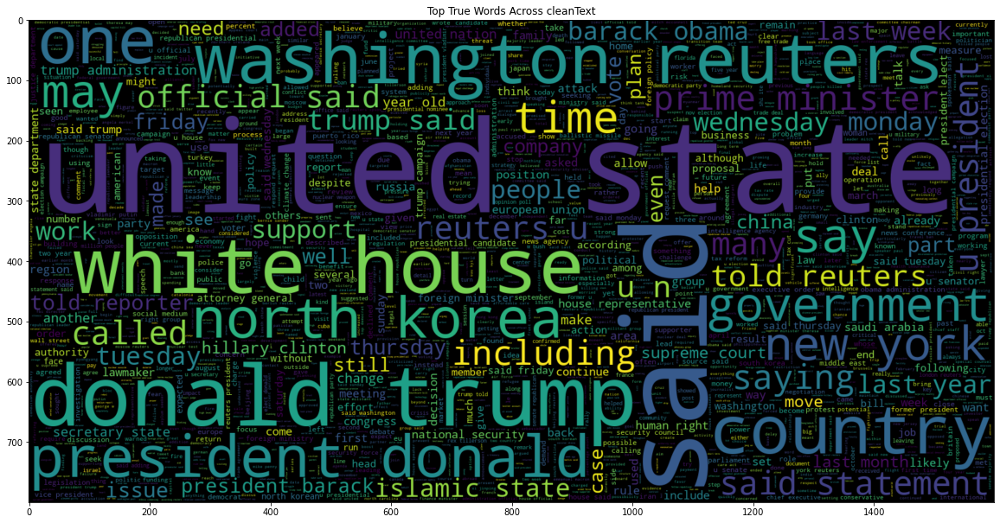

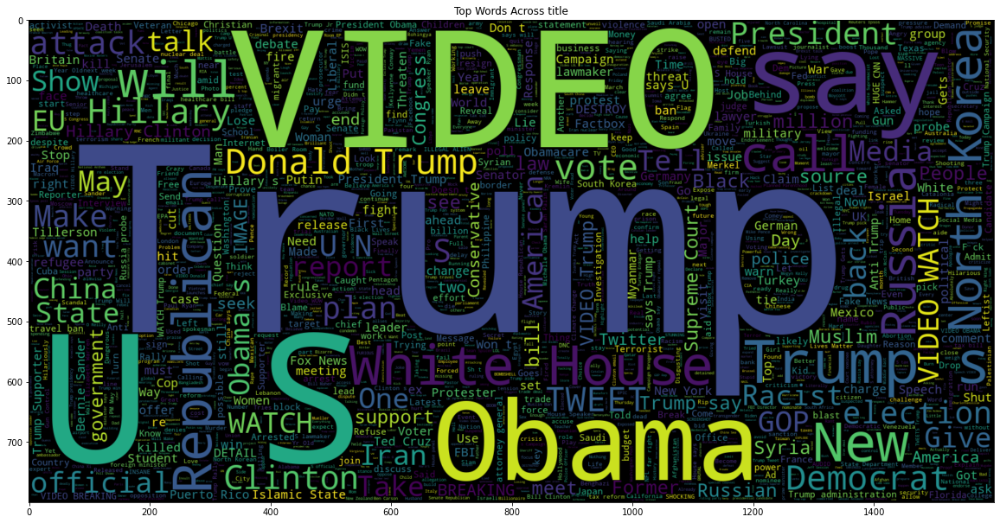

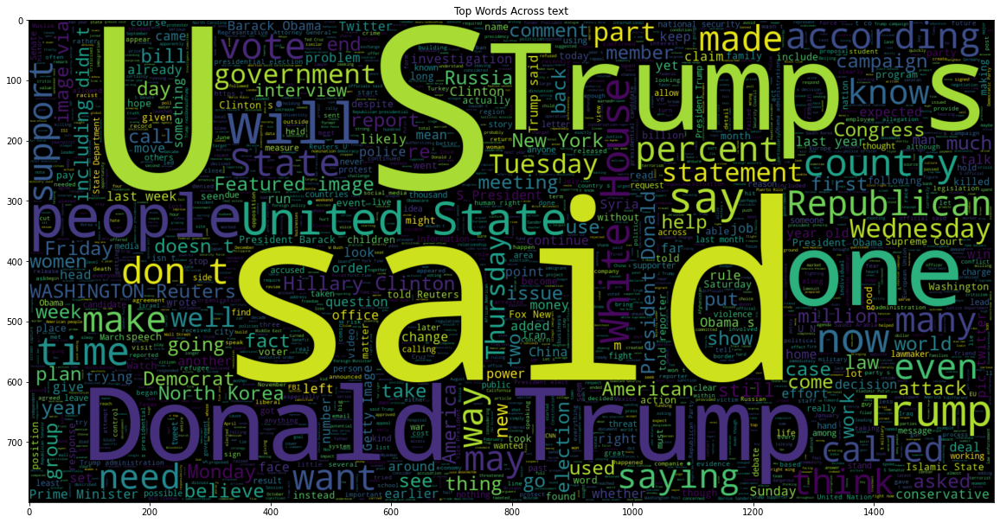

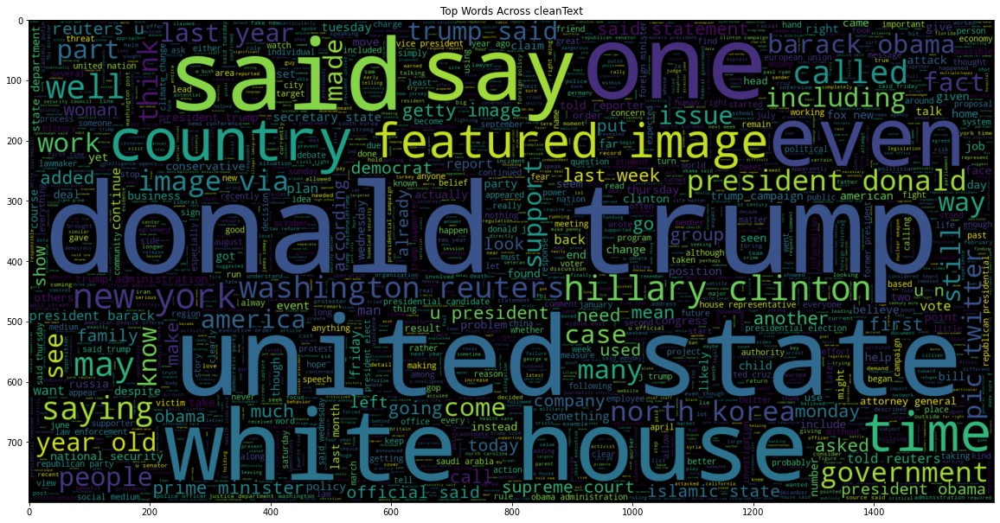

In [62]:
# Word Clouds for Fake, True, and Both for the title and clean text
text_columns = ['title','text','cleanText']
for key in df_dict:
    if key == 'All':
        for col in range(0, len(text_columns)):
            plt.figure(figsize = (20,20)) 
            plt.title(f"Top Words Across {text_columns[col]}", c='black',
                            horizontalalignment='center', fontdict= {'size': 12})
            wc = WordCloud(max_words = 2000 , width = 1600 , 
                            height = 800 ).generate(" ".join(Full_df[text_columns[col]]))
            plt.imshow(wc, cmap="icefire_r", interpolation = 'bilinear')
    else:
        for col in range(0, len(text_columns)):
            plt.figure(figsize = (20,20)) 
            plt.title(f"Top {key} Words Across {text_columns[col]}", c='black',
                            horizontalalignment='center', fontdict= {'size': 12})
            wc = WordCloud(max_words = 2000 , width = 1600 , 
                            height = 800 ).generate(" ".join(Full_df[Full_df.target == df_dict[key]][text_columns[col]]))
            plt.imshow(wc, cmap="icefire_r", interpolation = 'bilinear')

In [63]:
# Function to reduce the redundancy of typing out this code. Use only for EDA. Fits and transform with cvec

def cvect_fit_transform(series, min_df = 1, max_df = 1, max_features = 5000, stop_words = ENGLISH_STOP_WORDS, ngram_range=(1,1)):
    if type(series) != pd.core.series.Series: #Checks if it is a series otherwise throws the return statement
        return  "Not a Pandas Data Series" 
    else:
        cvec = CountVectorizer(
                            min_df = min_df,
                            max_features = max_features,
                            stop_words = stop_words,
                            ngram_range=ngram_range
                        )
        # Fit our vectorizier on our corpus
        cvec.fit(series)
        # Transform the corpus
        df_txt = cvec.transform(series)
        # Put data into a Data Frame format
        df_txt = pd.DataFrame(df_txt.todense(), 
                          columns=cvec.get_feature_names_out())
        return df_txt 

In [64]:
# Function to reduce the redundancy of typing out this code. Use only for EDA. 
# To be used after the cvec_fit_transform DataFrames function has been run to create the visualizations

def cvec_bar_plots(gram_model, title = None, xlab = "Frequency", xlabsize = 10, ylab = None, ylabsize = 10, figsize = (15,10), tsize = 20, headsize = 25, barcolor = 'skyblue'):
    plt.figure(figsize = figsize)
    gram_model.sum().sort_values(ascending=False).head(headsize).plot(kind='barh', color=barcolor)
    plt.title(title, c='black', horizontalalignment='center', fontdict= {'size': tsize})
    plt.ylabel(ylab, size=ylabsize, c='black')
    plt.xlabel(xlab, c="black", fontdict= {'size': xlabsize})
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)

# xlabel and y label naming convention from GA Linear Time Series Modeling lesson

##### Unigram - Fake News Set

In [65]:
Fake_df_txt=Full_df[Full_df['target']==1]['cleanText']

In [66]:
Fake_df_txt_cvec = cvect_fit_transform(Fake_df_txt, min_df = 3, max_df = 1, max_features = 5000, 
                    stop_words = ENGLISH_STOP_WORDS, ngram_range=(1,1))

In [67]:
Fake_df_txt_cvec.head()

,aaron,abandon,abandoned,abbott,abc,abedin,ability,able,abortion,abroad,...,yiannopoulos,york,young,younger,youth,youtube,zero,zimmerman,zone,zuckerberg
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


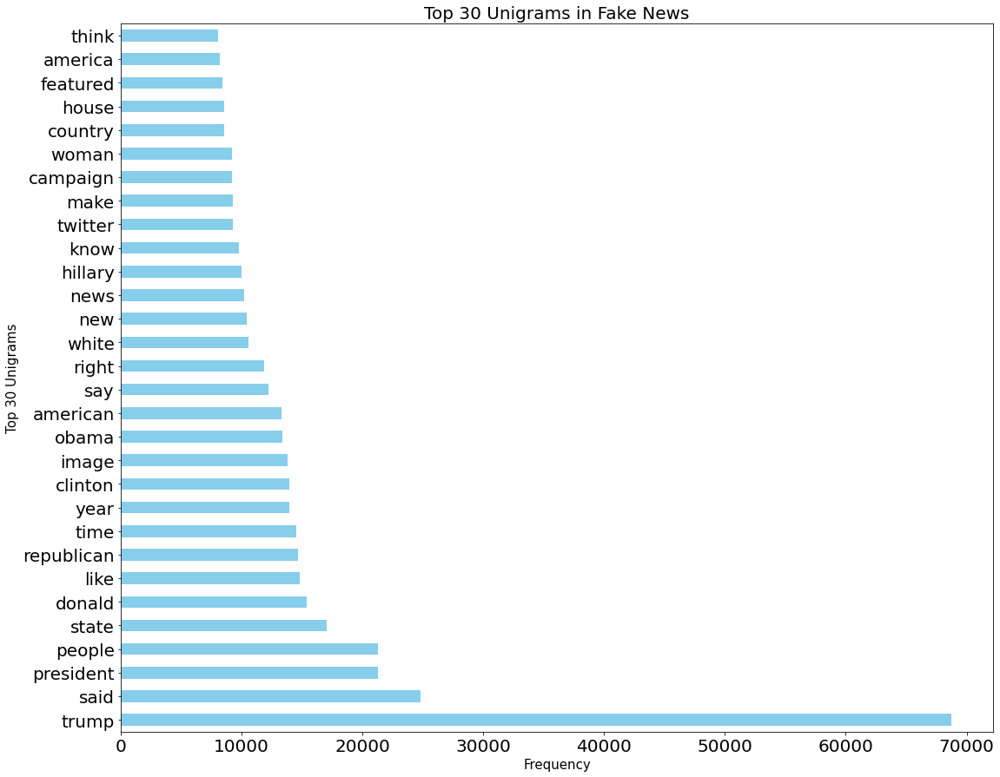

In [68]:
cvec_bar_plots(Fake_df_txt_cvec, title="Top 30 Unigrams in Fake News", 
            ylab="Top 30 Unigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=30)

##### Unigram - True News Set

In [69]:
True_df_txt=Full_df[Full_df['target']==0]['cleanText']

In [70]:
True_df_txt_cvec = cvect_fit_transform(True_df_txt, min_df = 3, max_df = 1, max_features = 5000, 
                    stop_words = ENGLISH_STOP_WORDS, ngram_range=(1,1))

In [71]:
True_df_txt_cvec.head()

,abadi,abandon,abandoned,abbas,abc,abdel,abdullah,abe,ability,able,...,zealand,zeid,zero,zika,zimbabwe,zimbabwean,zinke,zone,zor,zuma
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


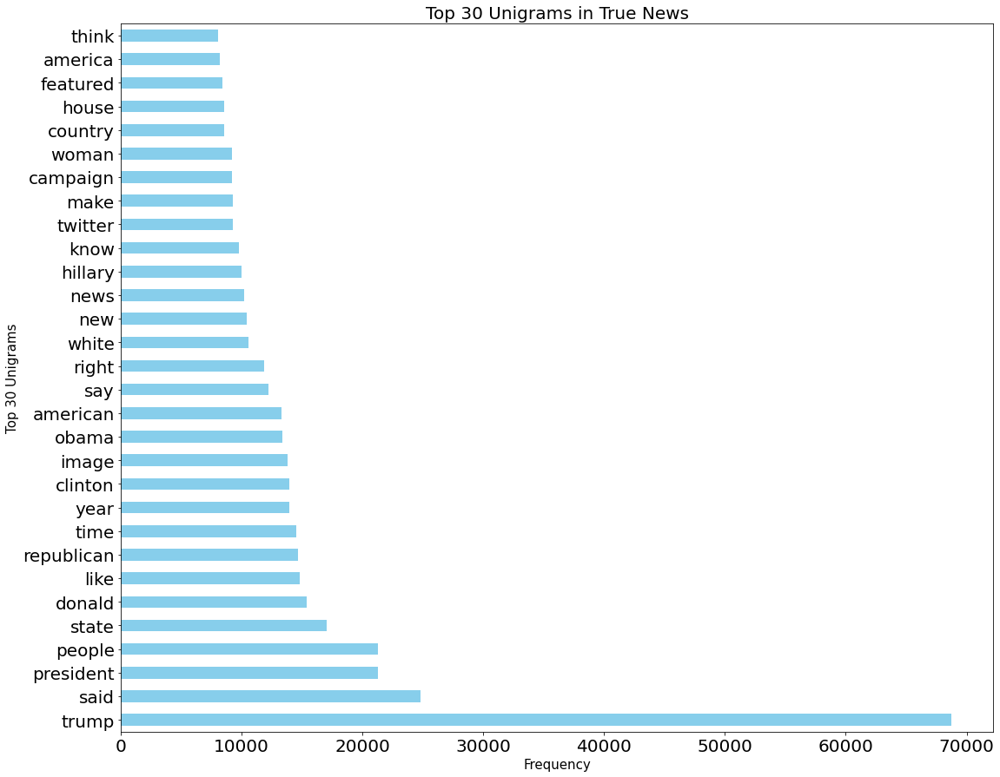

In [72]:
cvec_bar_plots(Fake_df_txt_cvec, title="Top 30 Unigrams in True News", 
            ylab="Top 30 Unigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=30)

#### Unigram - Full Set

In [73]:
Full_df_txt=Full_df['cleanText']

In [74]:
Full_df_txt_cvec = cvect_fit_transform(Full_df_txt, min_df = .02, max_df = 1, max_features = 5000, 
                    stop_words = ENGLISH_STOP_WORDS, ngram_range=(1,1))

In [75]:
Full_df_txt_cvec

,abc,ability,able,absolutely,abuse,accept,access,according,account,accusation,...,writing,written,wrong,wrote,year,yes,york,young,youtube,zone
0,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,18,0,0,0,0,0
1,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,0,0,2,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
38580,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,2,0,0,0,0,0
38581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3,0,0,0,0,0
38582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


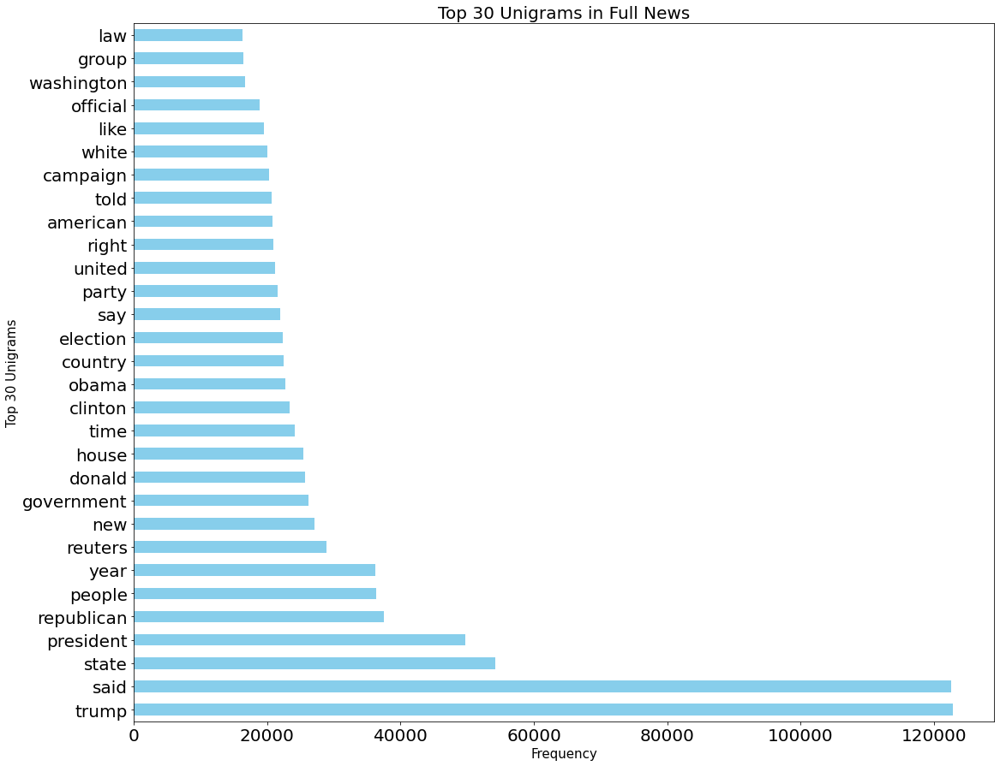

In [76]:
cvec_bar_plots(Full_df_txt_cvec, title="Top 30 Unigrams in Full News", 
            ylab="Top 30 Unigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=30)

##### Bigram - Fake News Set

In [77]:
Fake_df_txt_bi_cvec = cvect_fit_transform(Fake_df_txt, min_df = .02, max_df = 1, max_features = 5000, 
                    stop_words = 'english', ngram_range=(2,2))

In [78]:
Fake_df_txt_bi_cvec.head()

,african american,alex wong,american people,anti trump,attorney general,barack obama,bernie sander,black life,black people,breitbart news,...,washington post,watch video,white house,white supremacist,wire say,wire tv,year ago,year old,york city,york time
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


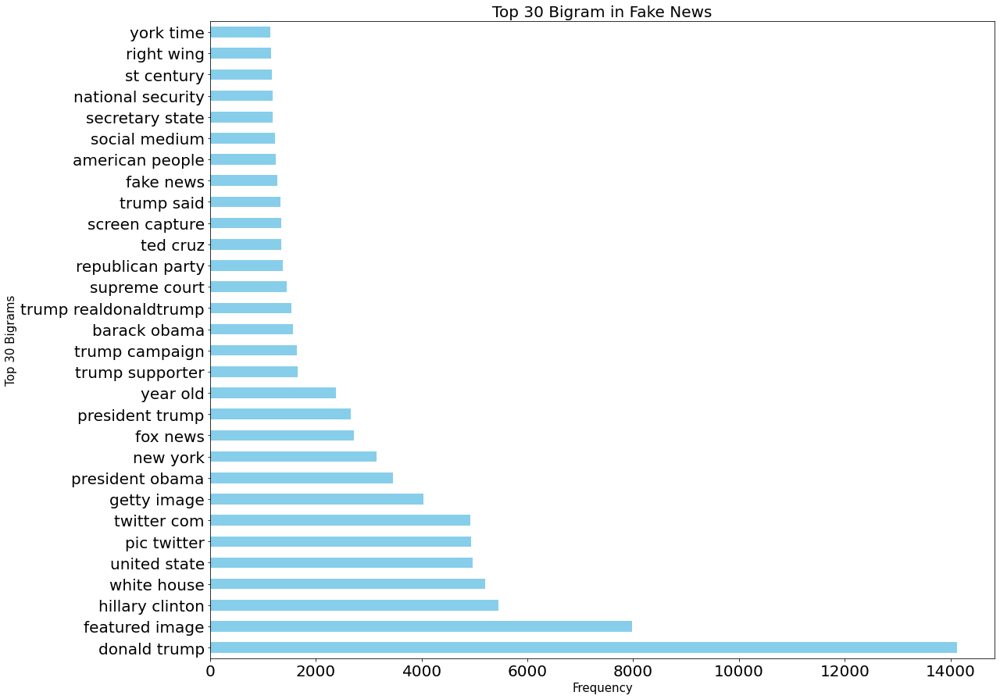

In [79]:
cvec_bar_plots(Fake_df_txt_bi_cvec, title="Top 30 Bigram in Fake News", 
            ylab="Top 30 Bigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=30)

##### Bigram - True News Set

In [80]:
True_df_txt_bi_cvec = cvect_fit_transform(True_df_txt, min_df = .02, max_df = 1, max_features = 5000, 
                    stop_words = 'english', ngram_range=(2,2))

In [81]:
True_df_txt_bi_cvec.head()

,administration official,agency said,angela merkel,attorney general,ballistic missile,barack obama,beijing reuters,berlin reuters,bernie sander,chancellor angela,...,vice president,vladimir putin,wall street,washington reuters,white house,xi jinping,year ago,year old,york reuters,york time
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,2
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,3,0,1,0,0,3
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0


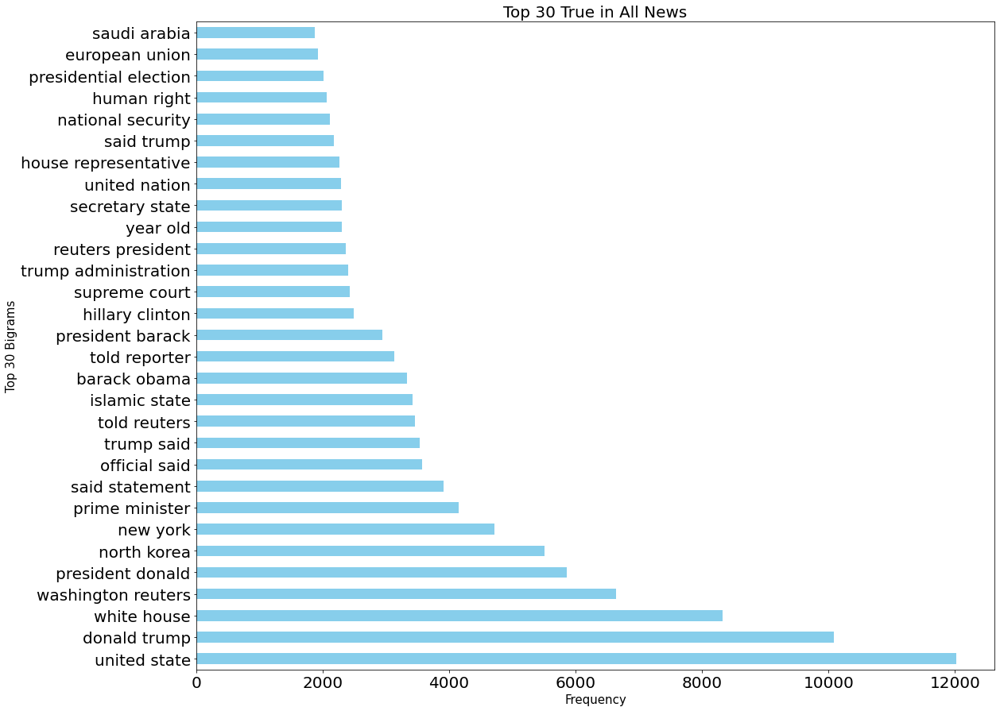

In [82]:
cvec_bar_plots(True_df_txt_bi_cvec, title="Top 30 True in All News", 
            ylab="Top 30 Bigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=30)

#### Bigrams - Full Set

In [83]:
Full_df_txt_bi_cvec = cvect_fit_transform(Full_df_txt, min_df = .02, max_df = 1, max_features = 5000, 
                    stop_words = 'english', ngram_range=(2,2))

In [84]:
Full_df_txt_bi_cvec.head()

,african american,american people,attorney general,barack obama,bernie sander,chief executive,climate change,clinton campaign,declined comment,democratic party,...,vice president,vladimir putin,wall street,washington post,washington reuters,white house,year ago,year old,york reuters,york time
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


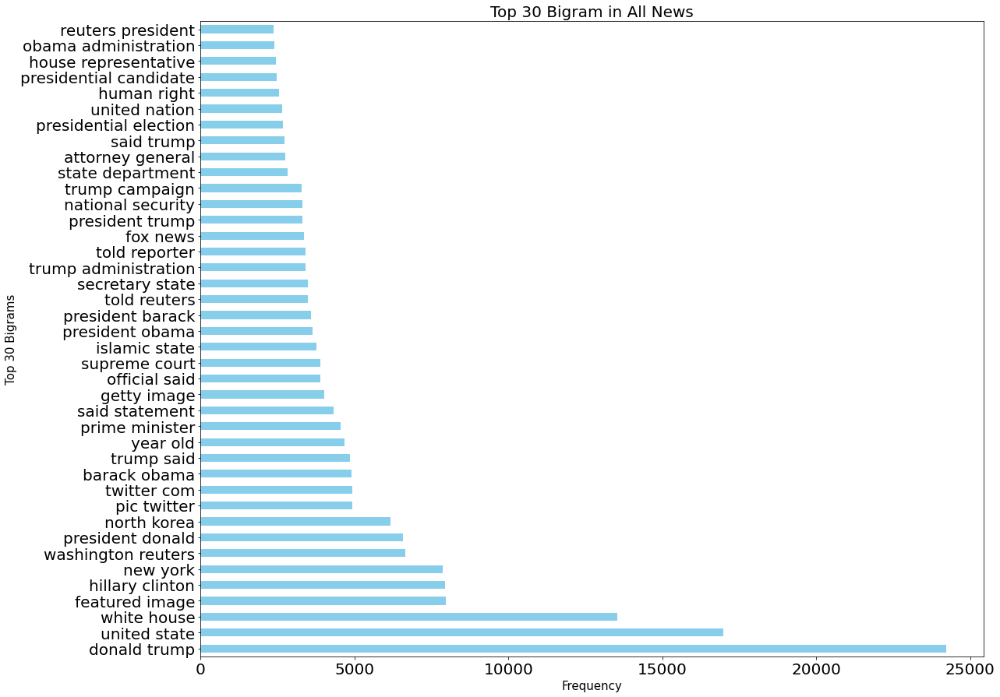

In [85]:
cvec_bar_plots(Full_df_txt_bi_cvec, title="Top 30 Bigram in All News", 
            ylab="Top 30 Bigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=40)

#### Trigrams - Fake News Set

In [86]:
Fake_df_txt_tri_cvec = cvect_fit_transform(Fake_df_txt, min_df = .002, max_df = 1, max_features = 5000, 
                    stop_words = 'english', ngram_range=(3,3))

In [87]:
Fake_df_txt_tri_cvec.head()

,abc news politics,according associated press,according new york,according washington post,according white house,acr brain trust,acr host hesher,acr live broadcast,acting attorney general,action childhood arrival,...,year old woman,year president obama,york city mayor,york daily news,york time report,york time reported,youtube donald trump,youtube featured image,youtube image video,zone listen player
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


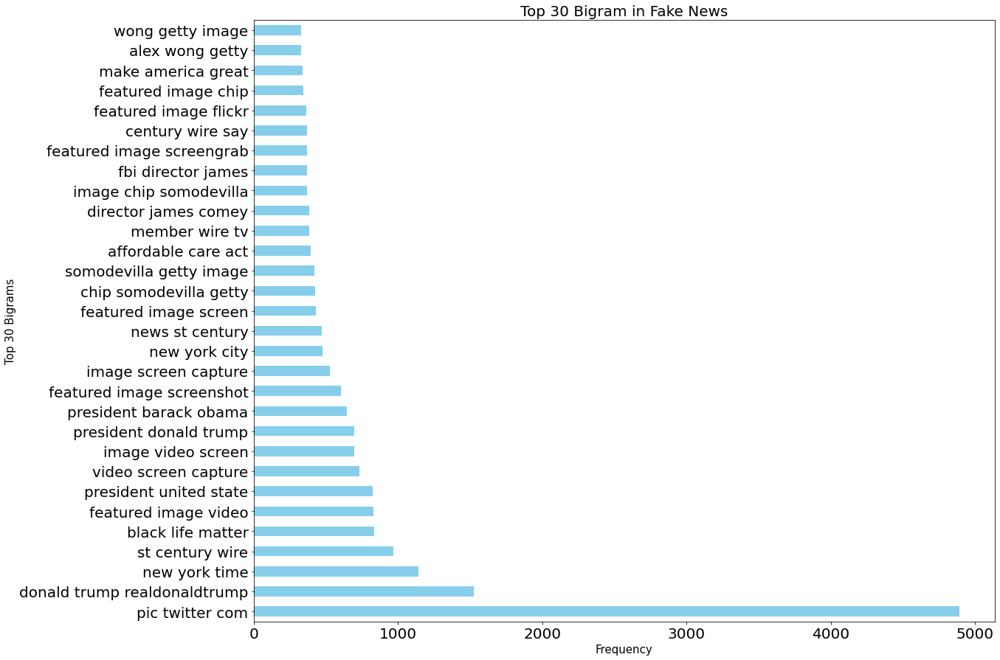

In [88]:
cvec_bar_plots(Fake_df_txt_tri_cvec, title="Top 30 Bigram in Fake News", 
            ylab="Top 30 Bigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=30)

#### Trigrams - True News Set

In [89]:
True_df_txt_tri_cvec = cvect_fit_transform(True_df_txt, min_df = .01, max_df = 1, max_features = 5000, 
                    stop_words = 'english', ngram_range=(3,3))

In [90]:
True_df_txt_tri_cvec.head()

,affordable care act,american free trade,attorney general jeff,bashar al assad,british prime minister,candidate donald trump,candidate hillary clinton,chancellor angela merkel,chinese president xi,counsel robert mueller,...,vice president mike,washington reuters house,washington reuters president,washington reuters republican,washington reuters senate,washington reuters white,white house official,white house said,white house spokesman,white house spokeswoman
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


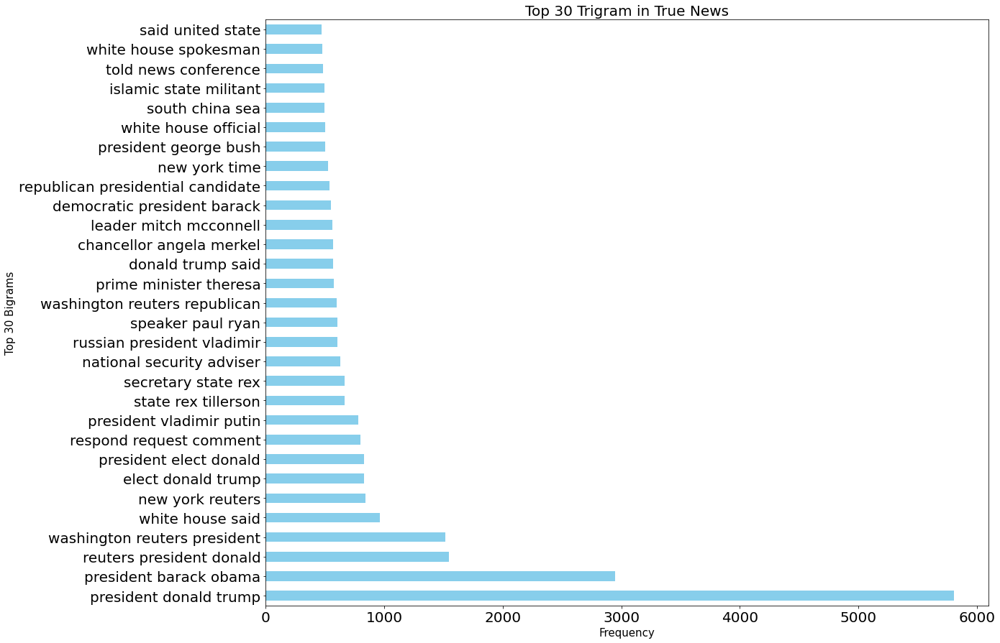

In [91]:
cvec_bar_plots(True_df_txt_tri_cvec, title="Top 30 Trigram in True News", 
            ylab="Top 30 Bigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=30)

#### Trigrams - Full News Set

In [92]:
Full_df_txt_tri_cvec = cvect_fit_transform(Full_df_txt, min_df = .01, max_df = 1, max_features = 5000, 
                    stop_words = 'english', ngram_range=(3,3))

In [93]:
Full_df_txt_tri_cvec.head()

,affordable care act,bashar al assad,black life matter,candidate donald trump,candidate hillary clinton,chancellor angela merkel,chip somodevilla getty,democrat hillary clinton,democratic president barack,democratic presidential candidate,...,told news conference,trump white house,vice president mike,video screen capture,washington reuters president,washington reuters republican,washington reuters senate,white house official,white house said,white house spokesman
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


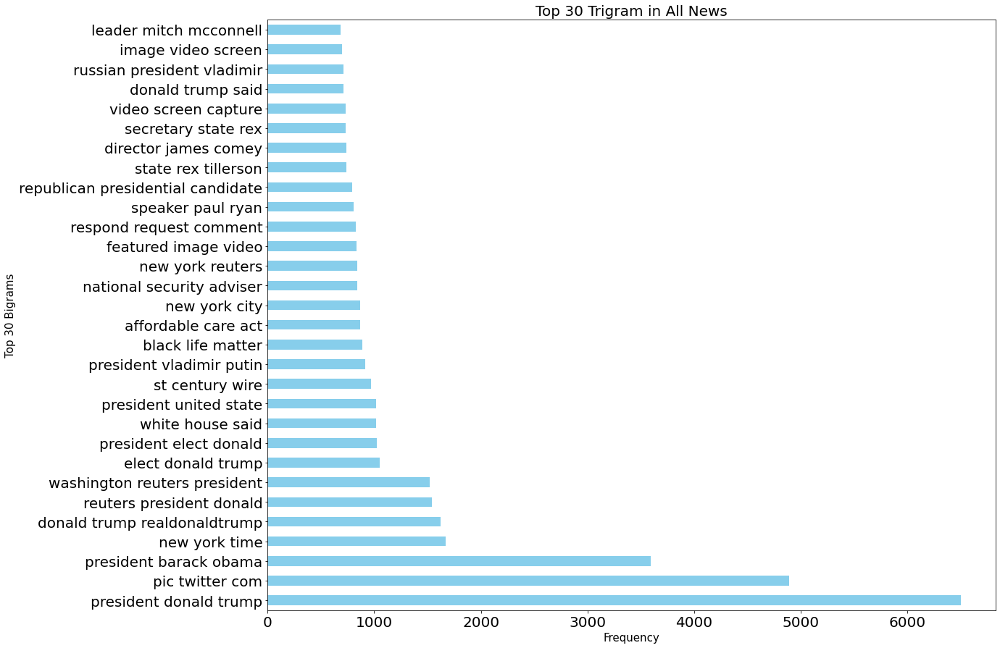

In [94]:
cvec_bar_plots(Full_df_txt_tri_cvec, title="Top 30 Trigram in All News", 
            ylab="Top 30 Bigrams", xlabsize = 15, ylabsize=15, figsize= (18,15), headsize=30)

# Model/Evaluation  <a id="model"></a> <!---source:https://stackoverflow.com/questions/28080066/how-to-reference-a-ipython-notebook-cell-in-markdown--->

#### &nbsp;&nbsp;&nbsp;&nbsp; - See [Modeling Notebook](./FakeNewsModeling.ipynb). <!---source: https://stackoverflow.com/questions/37847440/starting-jupyter-notebook-programmatically-from-another-notebook--->

# More Data/Retrain  <a id="retrain"></a>

#### More Fake

In [95]:
# Source: https://www.kaggle.com/datasets/mrisdal/fake-news
morefakedf = pd.read_csv('../Data/fake2.csv')
morefakedf.head()

,uuid,ord_in_thread,author,published,title,text,language,crawled,site_url,country,domain_rank,thread_title,spam_score,main_img_url,replies_count,participants_count,likes,comments,shares,type
0,6a175f46bcd24d39b3e962ad0f29936721db70db,0,Barracuda Brigade,2016-10-26T21:41:00.000+03:00,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,english,2016-10-27T01:49:27.168+03:00,100percentfedup.com,US,25689.0,Muslims BUSTED: They Stole Millions In Gov’t B...,0.000,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,0,1,0,0,0,bias
1,2bdc29d12605ef9cf3f09f9875040a7113be5d5b,0,reasoning with facts,2016-10-29T08:47:11.259+03:00,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,english,2016-10-29T08:47:11.259+03:00,100percentfedup.com,US,25689.0,Re: Why Did Attorney General Loretta Lynch Ple...,0.000,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,0,1,0,0,0,bias
2,c70e149fdd53de5e61c29281100b9de0ed268bc3,0,Barracuda Brigade,2016-10-31T01:41:49.479+02:00,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,english,2016-10-31T01:41:49.479+02:00,100percentfedup.com,US,25689.0,BREAKING: Weiner Cooperating With FBI On Hilla...,0.000,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,0,1,0,0,0,bias
3,7cf7c15731ac2a116dd7f629bd57ea468ed70284,0,Fed Up,2016-11-01T05:22:00.000+02:00,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,english,2016-11-01T15:46:26.304+02:00,100percentfedup.com,US,25689.0,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,0.068,http://100percentfedup.com/wp-content/uploads/...,0,0,0,0,0,bias
4,0206b54719c7e241ffe0ad4315b808290dbe6c0f,0,Fed Up,2016-11-01T21:56:00.000+02:00,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,english,2016-11-01T23:59:42.266+02:00,100percentfedup.com,US,25689.0,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,0.865,http://100percentfedup.com/wp-content/uploads/...,0,0,0,0,0,bias


In [96]:
# Inital shape
morefakedf.shape 

(12999, 20)

In [97]:
morefakedf.drop(columns=['uuid', 'ord_in_thread', 'site_url', 'country', 'domain_rank', 'thread_title', 'spam_score', 'main_img_url', 'replies_count', 'participants_count',
               'likes', 'comments', 'shares', 'author', 'crawled'], inplace =True)

In [98]:
morefakedf['language'].value_counts()

english       12403
russian         203
spanish         172
german          111
french           38
arabic           22
portuguese       11
turkish          10
italian           9
ignore            7
greek             4
dutch             3
norwegian         3
finnish           1
chinese           1
polish            1
Name: language, dtype: int64

In [99]:
morefakedf=morefakedf[morefakedf['language'] == 'english']

In [100]:
morefakedf['target'] = 1

In [101]:
morefakedf.rename(columns={'published':'date'}, inplace=True)

In [102]:
morefakedf['type'].value_counts()

bs            10900
bias            443
conspiracy      430
hate            243
satire          146
state           120
junksci         102
fake             19
Name: type, dtype: int64

In [103]:
morefakedf=morefakedf[morefakedf.type != 'state']

In [104]:
morefakedf.shape

(12283, 6)

In [105]:
morefakedf.drop(columns=['language', 'type'], inplace = True)

In [106]:
morefakedf = morefakedf.replace(' ', np.nan)

In [107]:
morefakedf = morefakedf.replace('', np.nan)

In [108]:
morefakedf.isnull().sum()

date        0
title     680
text      152
target      0
dtype: int64

In [109]:
morefakedf.dropna(inplace=True)

In [110]:
morefakedf

,date,title,text,target
0,2016-10-26T21:41:00.000+03:00,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,1
1,2016-10-29T08:47:11.259+03:00,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,1
2,2016-10-31T01:41:49.479+02:00,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,1
3,2016-11-01T05:22:00.000+02:00,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,1
4,2016-11-01T21:56:00.000+02:00,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,1
...,...,...,...,...
12908,2016-10-26T21:28:00.000+03:00,Tesla Earnings Smash Expectations After Dramat...,"Oct 26, 2016 4:26 PM 0 SHARES \nThere was a su...",1
12909,2016-10-26T23:53:43.161+03:00,Rules For Rulers (Or How The World Really Works),"The following video is a must watch, particula...",1
12910,2016-10-26T23:53:49.879+03:00,Fact Check: Trump Is Right that Clinton Might ...,She explains : \nHillary Clinton wants to star...,1
12911,2016-10-27T00:20:00.111+03:00,Caught On Tape: ISIS Destroys Iraqi Abrams Wit...,"YHC-FTSE Oct 26, 2016 5:14 PM \nWould have bee...",1


In [111]:
morefakedf.date=morefakedf.date.str[:-19] #removes last 19 characters in the date column

In [112]:
morefakedf

,date,title,text,target
0,2016-10-26,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,1
1,2016-10-29,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,1
2,2016-10-31,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,1
3,2016-11-01,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,1
4,2016-11-01,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,1
...,...,...,...,...
12908,2016-10-26,Tesla Earnings Smash Expectations After Dramat...,"Oct 26, 2016 4:26 PM 0 SHARES \nThere was a su...",1
12909,2016-10-26,Rules For Rulers (Or How The World Really Works),"The following video is a must watch, particula...",1
12910,2016-10-26,Fact Check: Trump Is Right that Clinton Might ...,She explains : \nHillary Clinton wants to star...,1
12911,2016-10-27,Caught On Tape: ISIS Destroys Iraqi Abrams Wit...,"YHC-FTSE Oct 26, 2016 5:14 PM \nWould have bee...",1


In [113]:
morefakedf['date'] = pd.to_datetime(morefakedf.date, format='%Y-%m-%d')

In [114]:
morefakedf.dtypes

date      datetime64[ns]
title             object
text              object
target             int64
dtype: object

In [115]:
morefakedf.head()

,date,title,text,target
0,2016-10-26,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,1
1,2016-10-29,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,1
2,2016-10-31,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,1
3,2016-11-01,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,1
4,2016-11-01,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,1


In [116]:
morefakedf.drop_duplicates(inplace = True)
morefakedf.shape

(11361, 4)

In [117]:
morefakedf.drop_duplicates(['title','text'], inplace = True)
morefakedf.shape

(11349, 4)

In [118]:
morefakedf.drop_duplicates(['text'], inplace = True)
morefakedf.shape

(11084, 4)

In [119]:
morefakedf['source'] = "Fake"

In [120]:
morefakedf.dtypes

date      datetime64[ns]
title             object
text              object
target             int64
source            object
dtype: object

#### More True

In [121]:
# Source: https://www.kaggle.com/datasets/rmisra/news-category-dataset
moretruedf = pd.read_json('../Data/News_Category_Dataset_v2.json', lines=True)

In [122]:
moretruedf.rename(columns={'headline':'title', 'short_description': 'text'}, inplace=True)

In [123]:
moretruedf['target'] = 0

In [124]:
moretruedf['category'].value_counts()

POLITICS          32739
WELLNESS          17827
ENTERTAINMENT     16058
TRAVEL             9887
STYLE & BEAUTY     9649
PARENTING          8677
HEALTHY LIVING     6694
QUEER VOICES       6314
FOOD & DRINK       6226
BUSINESS           5937
COMEDY             5175
SPORTS             4884
BLACK VOICES       4528
HOME & LIVING      4195
PARENTS            3955
THE WORLDPOST      3664
WEDDINGS           3651
WOMEN              3490
IMPACT             3459
DIVORCE            3426
CRIME              3405
MEDIA              2815
WEIRD NEWS         2670
GREEN              2622
WORLDPOST          2579
RELIGION           2556
STYLE              2254
SCIENCE            2178
WORLD NEWS         2177
TASTE              2096
TECH               2082
MONEY              1707
ARTS               1509
FIFTY              1401
GOOD NEWS          1398
ARTS & CULTURE     1339
ENVIRONMENT        1323
COLLEGE            1144
LATINO VOICES      1129
CULTURE & ARTS     1030
EDUCATION          1004
Name: category, 

In [125]:
moretruedf=moretruedf[moretruedf.category == 'POLITICS']

In [126]:
moretruedf.head()

,category,title,authors,link,text,date,target
13,POLITICS,Trump's Crackdown On Immigrant Parents Puts Mo...,Elise Foley and Roque Planas,https://www.huffingtonpost.com/entry/immigrant...,Last month a Health and Human Services officia...,2018-05-26,0
14,POLITICS,'Trump's Son Should Be Concerned': FBI Obtaine...,"Michael Isikoff, Yahoo News",https://www.huffingtonpost.com/entry/fbi-wiret...,The wiretaps feature conversations between Ale...,2018-05-26,0
15,POLITICS,Edward Snowden: There's No One Trump Loves Mor...,Mary Papenfuss,https://www.huffingtonpost.com/entry/edward-sn...,"But don't count on Robert Mueller to nail him,...",2018-05-26,0
16,POLITICS,Booyah: Obama Photographer Hilariously Trolls ...,Mary Papenfuss,https://www.huffingtonpost.com/entry/obama-pho...,Just a peeping minute.,2018-05-26,0
17,POLITICS,Ireland Votes To Repeal Abortion Amendment In ...,Laura Bassett,https://www.huffingtonpost.com/entry/results-f...,Irish women will no longer have to travel to t...,2018-05-26,0


In [127]:
moretruedf.drop(columns=['authors', 'link', 'category'], inplace=True)

In [128]:
moretruedf = moretruedf.replace('', np.nan)

In [129]:
moretruedf = moretruedf.replace(' ', np.nan)

In [130]:
# Initial Shape
moretruedf.shape

(32739, 4)

In [131]:
moretruedf.dropna(inplace=True)

In [132]:
moretruedf.drop_duplicates(inplace = True)
moretruedf.shape

(29567, 4)

In [133]:
moretruedf.drop_duplicates(['title','text'], inplace = True)
moretruedf.shape

(29564, 4)

In [134]:
moretruedf.drop_duplicates(['text'], inplace = True)
moretruedf.shape

(29186, 4)

In [135]:
moretruedf['date'] = moretruedf['date'].dt.strftime('%d-%m-%Y')

In [136]:
moretruedf['date'] = pd.to_datetime(moretruedf['date'], infer_datetime_format= True)

In [137]:
moretruedf.head()

,title,text,date,target
13,Trump's Crackdown On Immigrant Parents Puts Mo...,Last month a Health and Human Services officia...,2018-05-26,0
14,'Trump's Son Should Be Concerned': FBI Obtaine...,The wiretaps feature conversations between Ale...,2018-05-26,0
15,Edward Snowden: There's No One Trump Loves Mor...,"But don't count on Robert Mueller to nail him,...",2018-05-26,0
16,Booyah: Obama Photographer Hilariously Trolls ...,Just a peeping minute.,2018-05-26,0
17,Ireland Votes To Repeal Abortion Amendment In ...,Irish women will no longer have to travel to t...,2018-05-26,0


In [138]:
moretruedf['source'] = "True"

In [139]:
moretruedf.dtypes

title             object
text              object
date      datetime64[ns]
target             int64
source            object
dtype: object

#### Recent Data

In [140]:
# Source: https://ieee-dataport.org/open-access/fnid-fake-news-inference-dataset
recentdf = pd.read_csv('../Data/fnn_combined.csv')
recentdf.head()

,id,date,speaker,statement,sources,paragraph_based_content,fullText_based_content,label_fnn
0,1636,2010-03-28T17:45:34-04:00,Charlie Crist,"Rubio's tax swap proposal ""would have been a m...",['http://blogs.tampabay.com/buzz/files/040307l...,['Gov. Charlie Crist launched what amounts to ...,Gov. Charlie Crist launched what amounts to a ...,fake
1,4352,2011-08-29T06:00:00-04:00,Bobby Scott,"""The estimated savings of this (debt ceiling) ...",['http://www.bobbyscott.house.gov/index.php?op...,"['U.S. Rep. Bobby Scott, D-3rd, was not please...","U.S. Rep. Bobby Scott, D-3rd, was not pleased ...",real
2,16471,2019-02-12T17:35:38-05:00,Wisconsin Republican Legislative leaders,"Foxconn has already ""made a positive impact ac...",['https://www.wispolitics.com/2019/sen-fitzger...,"[""Amid reports questioning Foxconn Technology ...",Amid reports questioning Foxconn Technology Gr...,fake
3,1557,2010-03-05T18:24:02-05:00,Dave Aronberg,"Says Gov. Charlie Crist has called him ""a rock...","['http://www.davearonberg.com/about', 'http://...","[""State Sen. Dave Aronberg, a Democratic candi...","State Sen. Dave Aronberg, a Democratic candida...",real
4,12826,2016-07-29T18:09:31-04:00,Jeannette Vaught,"""Only five Texas counties account for almost 9...",['http://www.mystatesman.com/news/news/opinion...,['From the citrus of the Rio Grande Valley to ...,From the citrus of the Rio Grande Valley to th...,fake


In [141]:
recentdf.drop(columns=["id", "speaker", "sources", "statement" ], inplace=True)

In [142]:
recentdf.rename(columns={"paragraph_based_content":"text", "fullText_based_content":'all_text', "label_fnn": "target"}, inplace=True)

In [143]:
recentdf['target'].unique()

array(['fake', 'real', 'label_fnn', nan], dtype=object)

In [144]:
recentdf=recentdf[(recentdf['target'] =='fake') | (recentdf['target'] =='real')]

In [145]:
recentdf.head()

,date,text,all_text,target
0,2010-03-28T17:45:34-04:00,['Gov. Charlie Crist launched what amounts to ...,Gov. Charlie Crist launched what amounts to a ...,fake
1,2011-08-29T06:00:00-04:00,"['U.S. Rep. Bobby Scott, D-3rd, was not please...","U.S. Rep. Bobby Scott, D-3rd, was not pleased ...",real
2,2019-02-12T17:35:38-05:00,"[""Amid reports questioning Foxconn Technology ...",Amid reports questioning Foxconn Technology Gr...,fake
3,2010-03-05T18:24:02-05:00,"[""State Sen. Dave Aronberg, a Democratic candi...","State Sen. Dave Aronberg, a Democratic candida...",real
4,2016-07-29T18:09:31-04:00,['From the citrus of the Rio Grande Valley to ...,From the citrus of the Rio Grande Valley to th...,fake


In [146]:
recentdf['target'] = recentdf['target'].map({'fake': 1, 'real': 0})

In [147]:
# Initial Shape
recentdf.shape

(17324, 4)

In [148]:
recentdf = recentdf.replace('', np.nan)

In [149]:
recentdf = recentdf.replace(' ', np.nan)

In [150]:
recentdf.isnull().sum()

date        0
text        0
all_text    0
target      0
dtype: int64

In [151]:
recentdf.drop_duplicates(inplace = True)
recentdf.shape

(17323, 4)

In [152]:
recentdf.drop_duplicates(['text'], inplace = True)
recentdf.shape

(17323, 4)

In [153]:
recentdf.date=recentdf.date.str[:-15] #removes last 15 characters in the date column

In [154]:
recentdf

,date,text,all_text,target
0,2010-03-28,['Gov. Charlie Crist launched what amounts to ...,Gov. Charlie Crist launched what amounts to a ...,1
1,2011-08-29,"['U.S. Rep. Bobby Scott, D-3rd, was not please...","U.S. Rep. Bobby Scott, D-3rd, was not pleased ...",0
2,2019-02-12,"[""Amid reports questioning Foxconn Technology ...",Amid reports questioning Foxconn Technology Gr...,1
3,2010-03-05,"[""State Sen. Dave Aronberg, a Democratic candi...","State Sen. Dave Aronberg, a Democratic candida...",0
4,2016-07-29,['From the citrus of the Rio Grande Valley to ...,From the citrus of the Rio Grande Valley to th...,1
...,...,...,...,...
17321,2012-11-28,"['In legislation filed this week , U.S. Sen. J...","In legislation filed this week , U.S. Sen. Joh...",0
17322,2020-01-09,['Sen. Bernie Sanders argues that former Vice ...,Sen. Bernie Sanders argues that former Vice Pr...,1
17323,2019-06-18,"['Ready for some ""billionaire talk,"" as a rece...","Ready for some ""billionaire talk,"" as a recent...",1
17324,2012-04-18,['We know why labor unions stand against Repub...,We know why labor unions stand against Republi...,1


In [155]:
recentdf['date'] = pd.to_datetime(recentdf['date'], infer_datetime_format= True)

In [159]:
recentdf["source"] = "recent"

#### Combine New Data

In [160]:
columns = ["text","target","date", "source"]

In [161]:
new_data = [morefakedf[columns],moretruedf[columns],recentdf[columns]]
new_data = pd.concat(new_data, ignore_index=True)
new_data.head()

,text,target,date,source
0,Print They should pay all the back all the mon...,1,2016-10-26,Fake
1,Why Did Attorney General Loretta Lynch Plead T...,1,2016-10-29,Fake
2,Red State : \nFox News Sunday reported this mo...,1,2016-10-31,Fake
3,Email Kayla Mueller was a prisoner and torture...,1,2016-11-01,Fake
4,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,1,2016-11-01,Fake


In [162]:
new_data[['source','target']].groupby('source').value_counts()

source  target
Fake    1         11084
True    0         29186
recent  0          8766
        1          8557
dtype: int64

In [163]:
new_data['target'].value_counts()

0    37952
1    19641
Name: target, dtype: int64

In [164]:
newfinal = new_data.sort_values('target', ascending = False)[:-18311]

In [165]:
newfinal['target'].value_counts()

1    19641
0    19641
Name: target, dtype: int64

In [166]:
newfinal

,text,target,date,source
0,Print They should pay all the back all the mon...,1,2016-10-26,Fake
53600,['Miami Herald columnist Carl Hiaasen torched ...,1,2012-03-27,recent
53588,"['If past is prologue, then Bernie Sanders’ ef...",1,2019-03-05,recent
53591,['A Facebook post from the Jerusalem Prayer Te...,1,2020-04-24,recent
53592,"['For the past few years, campaigns against hu...",1,2015-01-29,recent
...,...,...,...,...
20083,This is how democracy works in the post Citize...,0,2017-05-26,True
20084,Republican Congressman Greg Gianforte's half-h...,0,2017-05-26,True
20085,Additional flexibility is good for their clien...,0,2017-05-26,True
20086,"Despite his promises, he would sacrifice the n...",0,2017-05-26,True


In [167]:
newfinal['cleanText'] = newfinal['text'].apply(lambda x:Preprocessing(x))

In [168]:
newfinal

,text,target,date,source,cleanText
0,Print They should pay all the back all the mon...,1,2016-10-26,Fake,print pay back money plus interest entire fami...
53600,['Miami Herald columnist Carl Hiaasen torched ...,1,2012-03-27,recent,miami herald columnist carl hiaasen torched fl...
53588,"['If past is prologue, then Bernie Sanders’ ef...",1,2019-03-05,recent,past prologue bernie sander effort win african...
53591,['A Facebook post from the Jerusalem Prayer Te...,1,2020-04-24,recent,facebook post jerusalem prayer team american c...
53592,"['For the past few years, campaigns against hu...",1,2015-01-29,recent,past year campaign human sex trafficking swell...
...,...,...,...,...,...
20083,This is how democracy works in the post Citize...,0,2017-05-26,True,democracy work post citizen united era
20084,Republican Congressman Greg Gianforte's half-h...,0,2017-05-26,True,republican congressman greg gianforte half hea...
20085,Additional flexibility is good for their clien...,0,2017-05-26,True,additional flexibility good client well
20086,"Despite his promises, he would sacrifice the n...",0,2017-05-26,True,despite promise would sacrifice need ordinary ...


In [169]:
Full_df.shape

(38584, 13)

In [183]:
chosencolumns = ['text','cleanText','target','date']

In [184]:
dfs=[Full_df[chosencolumns], newfinal[chosencolumns]]
retraindata = pd.concat(dfs, ignore_index=True)
retraindata.head()
#Leticia Methodology to join

,text,cleanText,target,date
0,Donald Trump just couldn t wish all Americans ...,donald trump wish american happy new year leav...,1,2017-12-31
1,House Intelligence Committee Chairman Devin Nu...,house intelligence committee chairman devin nu...,1,2017-12-31
2,"On Friday, it was revealed that former Milwauk...",friday revealed former milwaukee sheriff david...,1,2017-12-30
3,"On Christmas day, Donald Trump announced that ...",christmas day donald trump announced would bac...,1,2017-12-29
4,Pope Francis used his annual Christmas Day mes...,pope francis used annual christmas day message...,1,2017-12-25


In [185]:
retraindata.isna().sum()

text         0
cleanText    0
target       0
date         0
dtype: int64

In [186]:
retraindata.dtypes

text                 object
cleanText            object
target                int64
date         datetime64[ns]
dtype: object

In [187]:
retraindata.to_csv('../Data/retrain.csv',index=False)

In [188]:
retraindata.shape
# Expect 77866 rows

(77866, 4)

In [189]:
final_df = pd.read_csv('../Data/retrain.csv')

In [190]:
# Reloading data has new nulls
final_df.dropna(inplace=True)

In [191]:
final_df

,text,cleanText,target,date
0,Donald Trump just couldn t wish all Americans ...,donald trump wish american happy new year leav...,1,2017-12-31
1,House Intelligence Committee Chairman Devin Nu...,house intelligence committee chairman devin nu...,1,2017-12-31
2,"On Friday, it was revealed that former Milwauk...",friday revealed former milwaukee sheriff david...,1,2017-12-30
3,"On Christmas day, Donald Trump announced that ...",christmas day donald trump announced would bac...,1,2017-12-29
4,Pope Francis used his annual Christmas Day mes...,pope francis used annual christmas day message...,1,2017-12-25
...,...,...,...,...
77861,This is how democracy works in the post Citize...,democracy work post citizen united era,0,2017-05-26
77862,Republican Congressman Greg Gianforte's half-h...,republican congressman greg gianforte half hea...,0,2017-05-26
77863,Additional flexibility is good for their clien...,additional flexibility good client well,0,2017-05-26
77864,"Despite his promises, he would sacrifice the n...",despite promise would sacrifice need ordinary ...,0,2017-05-26


In [192]:
final_df.shape
#expect 77838 rows

(77838, 4)

In [193]:
final_df.to_csv('../Data/retrain.csv',index=False)

In [195]:
min(final_df['date'])

'2007-05-02'

In [201]:
final_df['date'] = pd.to_datetime(final_df['date'])

In [202]:
final_df.dtypes

text                 object
cleanText            object
target                int64
date         datetime64[ns]
dtype: object

In [209]:
final_df['date']

0       2017-12-31
1       2017-12-31
2       2017-12-30
3       2017-12-29
4       2017-12-25
           ...    
77861   2017-05-26
77862   2017-05-26
77863   2017-05-26
77864   2017-05-26
77865   2017-05-26
Name: date, Length: 77838, dtype: datetime64[ns]

In [214]:
#create a column to extract year from date
final_df['year'] = pd.DatetimeIndex(final_df['date']).year

In [243]:
final_year = final_df[['year','target']]

In [250]:
count_year = final_year[final_year['target']==1].groupby('year').sum()

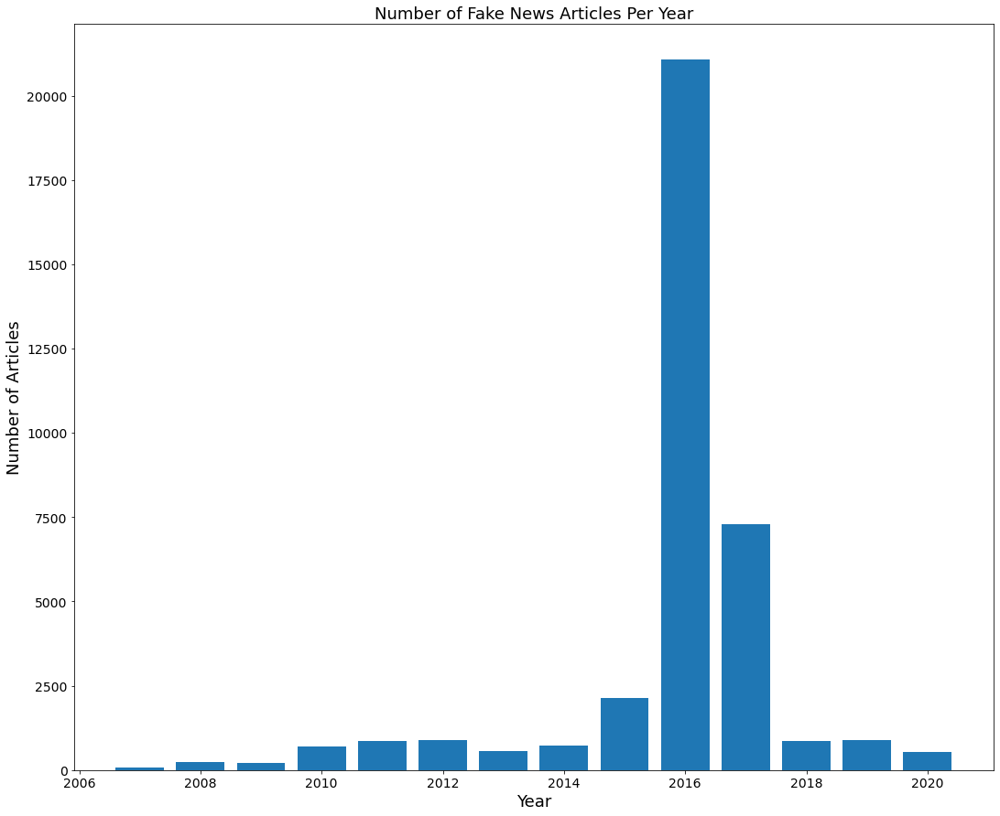

In [289]:
plt.figure(figsize=(18,15))
plt.bar(count_year.index,count_year['target'])
plt.ylabel("Number of Articles", {'size' : 18})
plt.xlabel("Year", fontdict = {'size' : 18})
plt.title("Number of Fake News Articles Per Year", fontdict= {'size' : 18})
plt.xticks(size = 14)
plt.yticks(size = 14);

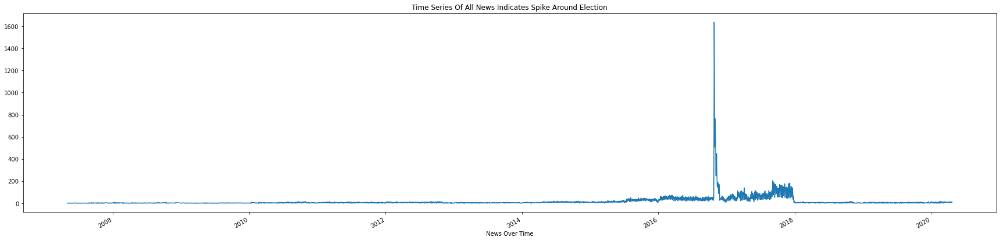

In [210]:
time_plots(final_df, title='Time Series Of All News Indicates Spike Around Election')

# New Unigrams and Bi Grams of Fake

In [ ]:
Fake_final_df_txt=final_df[final_df['target']==1]['cleanText']

In [ ]:
Fake_final_df_txt_cvec = cvect_fit_transform(Fake_final_df_txt, min_df = 3, max_df = 1, max_features = 5000, 
                    stop_words = ENGLISH_STOP_WORDS, ngram_range=(1,1))

In [ ]:
cvec_bar_plots(Fake_final_df_txt_cvec, title="Top 10 Unigrams in Fake News", 
            ylab="Top 10 Unigrams", xlabsize = 20, ylabsize=20, figsize= (18,15), headsize=10)

In [ ]:
Fake_final_df_txt_cvec = cvect_fit_transform(Fake_final_df_txt, min_df = 3, max_df = 1, max_features = 5000, 
                    stop_words = ENGLISH_STOP_WORDS, ngram_range=(2,2))

In [ ]:
cvec_bar_plots(Fake_final_df_txt_cvec, title="Top 10 Bigrams in Fake News", 
            ylab="Top 10 Bigrams", xlabsize = 20, ylabsize=20, figsize= (18,15), headsize=10)

# New Word Clouds

In [ ]:
df_dict = {'Fake': 1,'True':0,'All':None}

In [ ]:
#Word Clouds for Fake, True, and Both for the title and clean text
text_columns = ['cleanText']
for key in df_dict:
    if key == 'All':
        for col in range(0, len(text_columns)):
            plt.figure(figsize = (20,20)) 
            plt.title(f"Top Words Across {text_columns[col]}", c='black',
                            horizontalalignment='center', fontdict= {'size': 12})
            wc = WordCloud(max_words = 2000 , width = 1600 , 
                            height = 800 ).generate(" ".join(final_df[text_columns[col]]))
            plt.imshow(wc, cmap="icefire_r", interpolation = 'bilinear')
    else:
        for col in range(0, len(text_columns)):
            plt.figure(figsize = (20,20)) 
            plt.title(f"Top {key} Words Across {text_columns[col]}", c='black',
                            horizontalalignment='center', fontdict= {'size': 12})
            wc = WordCloud(max_words = 2000 , width = 1600 , 
                            height = 800 ).generate(" ".join(final_df[final_df.target == df_dict[key]][text_columns[col]]))
            plt.imshow(wc, cmap="icefire_r", interpolation = 'bilinear')

# Findings:

|                               | Train Set | Test Set | Sensitivity/Recall |
|:-----------------------------:|:---------:|:--------:|:------------------:|
|  Logistic Regression CVECIDF  |    90%    |    90%   |         86%        |
|       Random Forest TVEC      |    83%    |    83%   |         76%        |
| Decision Tree Classifier TVEC |    86%    |    84%   |         81%        |
|          SVC CVECIDF          |    99%    |    91%   |         88%        |
|            KNN TVEC           |    90%    |    74%   |         66%        |
|        Naive Bayes TVEC       |    79%    |    78%   |         69%        |

# Conclusions:

In conclusion, we would want to go with our SVC model to classify news. We want to go with SVC because not only does it have the highest accuracy but also it has the best sensitivity score of 88% where it will correctly identify fake news to be fake 88% of the time!